## Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import os
import torch
import random
import tensorflow as tf
import cv2
from tqdm import tqdm
import datetime
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from tensorflow.keras.layers import Input, Add, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, MeanSquaredError, BinaryCrossentropy
from tensorflow.keras.utils import plot_model
from tensorflow.keras import callbacks

from  matplotlib import pyplot as plt
import matplotlib.image as mpimg
from IPython.display import clear_output
%matplotlib inline

from IPython.display import HTML
from base64 import b64encode

## Load Dataset

In [ ]:
# Load directories
train_data_dir = "/content/drive/MyDrive/Road Segmentation/training/image_2/"
train_gt_dir = "/content/drive/MyDrive/Road Segmentation/training/gt_image_2/"

test_data_dir = "/content/drive/MyDrive/Road Segmentation/testing/"

In [ ]:
# Number of training examples
TRAINSET_SIZE = int(len(os.listdir(train_data_dir)) * 0.8)
print(f"Number of Training Examples: {TRAINSET_SIZE}")

VALIDSET_SIZE = int(len(os.listdir(train_data_dir)) * 0.1)
print(f"Number of Validation Examples: {VALIDSET_SIZE}")

TESTSET_SIZE = int(len(os.listdir(train_data_dir)) - TRAINSET_SIZE - VALIDSET_SIZE)
print(f"Number of Testing Examples: {TESTSET_SIZE}")

Number of Training Examples: 231
Number of Validation Examples: 28
Number of Testing Examples: 30


In [ ]:
# Initialize Constants
IMG_SIZE = 128
N_CHANNELS = 3
N_CLASSES = 1
SEED = 123

In [ ]:
# Function to load image and return a dictionary
def parse_image(img_path: str) -> dict:
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.uint8)

    # Three types of img paths: um, umm, uu
    # gt image paths: um_road, umm_road, uu_road
    mask_path = tf.strings.regex_replace(img_path, "image_2", "gt_image_2")
    mask_path = tf.strings.regex_replace(mask_path, "um_", "um_road_")
    mask_path = tf.strings.regex_replace(mask_path, "umm_", "umm_road_")
    mask_path = tf.strings.regex_replace(mask_path, "uu_", "uu_road_")

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)

    non_road_label = np.array([255, 0, 0])
    road_label = np.array([255, 0, 255])
    other_road_label = np.array([0, 0, 0])

    # Convert to mask to binary mask
    mask = tf.experimental.numpy.all(mask == road_label, axis = 2)
    mask = tf.cast(mask, tf.uint8)
    mask = tf.expand_dims(mask, axis=-1)

    return {'image': image, 'segmentation_mask': mask}

In [ ]:
# Generate dataset variables
all_dataset = tf.data.Dataset.list_files(train_data_dir + "*.png", seed=SEED)
all_dataset = all_dataset.map(parse_image)

train_dataset = all_dataset.take(TRAINSET_SIZE + VALIDSET_SIZE)
val_dataset = train_dataset.skip(TRAINSET_SIZE)
train_dataset = train_dataset.take(TRAINSET_SIZE)
test_dataset = all_dataset.skip(TRAINSET_SIZE + VALIDSET_SIZE)

### Apply Transformations

In [ ]:
# Tensorflow function to rescale images to [0, 1]
@tf.function
def normalize(input_image: tf.Tensor, input_mask: tf.Tensor) -> tuple:
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

# Tensorflow function to apply preprocessing transformations
@tf.function
def load_image_train(datapoint: dict) -> tuple:
    input_image = tf.image.resize(datapoint['image'], (IMG_SIZE, IMG_SIZE))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (IMG_SIZE, IMG_SIZE))

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

# Tensorflow function to preprocess validation images
@tf.function
def load_image_test(datapoint: dict) -> tuple:
    input_image = tf.image.resize(datapoint['image'], (IMG_SIZE, IMG_SIZE))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (IMG_SIZE, IMG_SIZE))

    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [ ]:
BATCH_SIZE = 32
BUFFER_SIZE = 1000

dataset = {"train": train_dataset, "val": val_dataset, "test": test_dataset}

# -- Train Dataset --#
dataset["train"] = dataset["train"].map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
dataset["train"] = dataset["train"].shuffle(buffer_size=BUFFER_SIZE, seed=SEED)
dataset["train"] = dataset["train"].repeat()
dataset["train"] = dataset["train"].batch(BATCH_SIZE)
dataset["train"] = dataset["train"].prefetch(buffer_size=tf.data.AUTOTUNE)

#-- Validation Dataset --#
dataset['val'] = dataset['val'].map(load_image_test)
# dataset['val'] = dataset['val'].repeat()
dataset['val'] = dataset['val'].batch(BATCH_SIZE)
dataset['val'] = dataset['val'].prefetch(buffer_size=tf.data.AUTOTUNE)

#-- Testing Dataset --#
dataset['test'] = dataset['test'].map(load_image_test)
dataset['test'] = dataset['test'].batch(BATCH_SIZE)
dataset['test'] = dataset['test'].prefetch(buffer_size=tf.data.AUTOTUNE)

print(dataset['train'])
print(dataset['val'])
print(dataset['test'])

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>


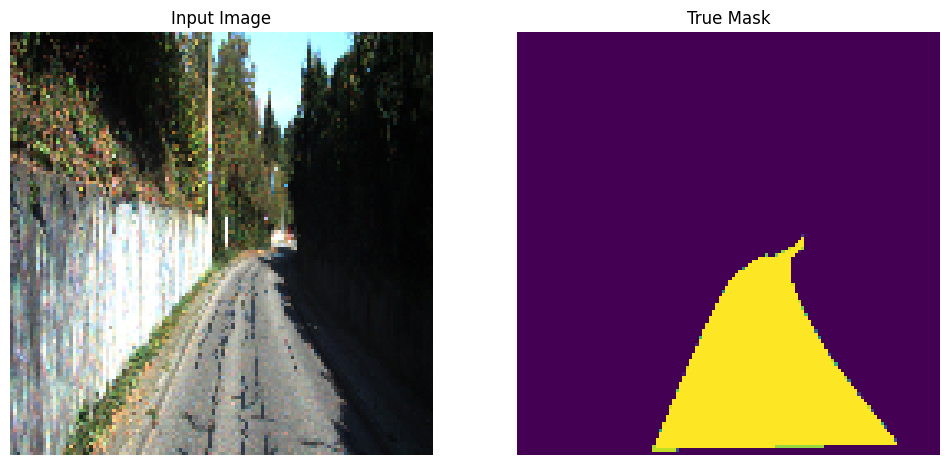

In [ ]:
# Function to view the images from the directory
def display_sample(display_list):
    plt.figure(figsize=(12,12))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')

    plt.show()

for image, mask in dataset["train"].take(1):
    sample_image, sample_mask = image, mask

display_sample([sample_image[0], sample_mask[0]])

In [ ]:
# Get VGG-16 network as backbone
vgg16_model = VGG16()
vgg16_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Define input shape
input_shape = (IMG_SIZE, IMG_SIZE, N_CHANNELS)

In [ ]:
# Generate a new model using the VGG network
# Input
inputs = Input(input_shape)

# VGG network
vgg16_model = VGG16(include_top=False, weights = 'imagenet', input_tensor=inputs)

# Encoder Layers
c1 = vgg16_model.get_layer("block3_pool").output
c2 = vgg16_model.get_layer("block4_pool").output
c3 = vgg16_model.get_layer("block5_pool").output

# Decoder
u1 = UpSampling2D((2,2), interpolation='bilinear')(c3)
d1 = Concatenate()([u1,c2])

u2 = UpSampling2D((2, 2), interpolation = 'bilinear')(d1)
d2 = Concatenate()([u2, c1])

u3 = UpSampling2D((8, 8), interpolation='bilinear')(d2)
outputs = Conv2D(N_CLASSES, 1, activation='sigmoid')(u3)

model = Model(inputs, outputs, name = "VGG_FCN8")

## Training

### Loss Function

In [ ]:
m_iou = tf.keras.metrics.MeanIoU(num_classes=2)

model.compile(
    optimizer=Adam(),
    loss=BinaryCrossentropy(),
    metrics=[m_iou]
)

### Check Model

In [ ]:
# Function to create a mask out of network prediction
def create_mask(pred_mask: tf.Tensor) -> tf.Tensor:
    # Round to closest
    pred_mask = tf.math.round(pred_mask)

    # [IMG_SIZE, IMG_SIZE] -> [IMG_SIZE, IMG_SIZE, 1]
    pred_mask = tf.expand_dims(pred_mask, axis=-1)
    pred_mask = tf.squeeze(pred_mask, axis=-1)
    return pred_mask

# Function to show predictions
def show_predictions(dataset=None, num=1):
    """
    Pulls `num` samples from `dataset`, converts them to numpy,
    runs model.predict on each, and displays input / true / pred.
    """
    if dataset:
        # Take num *batches* (we’ll break them down below)
        for batch_imgs, batch_masks in dataset.take(num):
            # batch_imgs: tf.Tensor, shape=(batch_size, H, W, C)
            # batch_masks: tf.Tensor, shape=(batch_size, H, W, 1)
            for img_tensor, mask_tensor in zip(batch_imgs, batch_masks):
                # Convert each to numpy array (now shapes are concrete)
                img = img_tensor.numpy()       # shape = (H, W, 3)
                mask = mask_tensor.numpy()     # shape = (H, W, 1)

                # Add batch axis, predict, then drop batch axis
                pred = model.predict(img[None, ...])    # shape = (1, H, W, 1)
                pred = pred[0]                           # shape = (H, W, 1)

                # Display input / true / predicted
                display_sample([img, mask, create_mask(pred)])

                plt.pause(0.001)
                plt.close('all')
            break  # only do the first batch

    else:
        # for your standalone sample_image, sample_mask
        img = sample_image[0].numpy()    # (H, W, 3)
        mask = sample_mask[0].numpy()    # (H, W, 1)
        pred = model.predict(img[None, ...])[0]
        display_sample([img, mask, create_mask(pred)])
        plt.pause(0.001)
        plt.close('all')

### Train Model

In [ ]:
# Callbacks and Logs
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        show_predictions(dataset['val'], num=1)
        print('\nSample Prediction after epoch {}\n'.format(epoch + 1))

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

callbacks_list = [
    DisplayCallback(),
    tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1),
    tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    tf.keras.callbacks.ModelCheckpoint('best_model.h5', verbose=1, save_best_only=True)
]

# Set Variables
EPOCHS = 200
STEPS_PER_EPOCH = TRAINSET_SIZE // BATCH_SIZE
VALIDATION_STEPS = VALIDSET_SIZE // BATCH_SIZE

In [ ]:
print(STEPS_PER_EPOCH)
print(VALIDATION_STEPS)

7
0


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


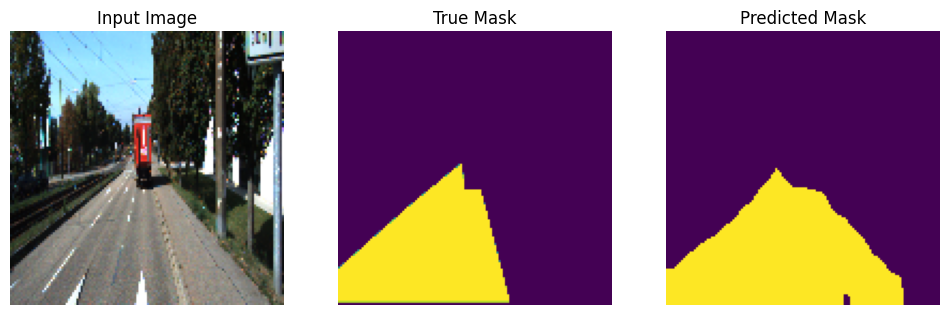

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


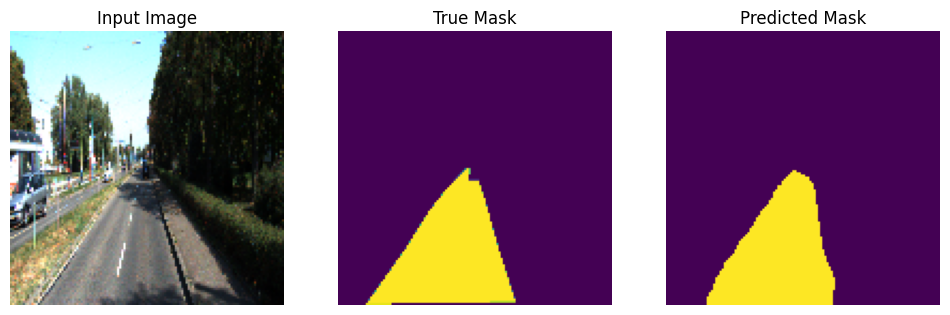

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


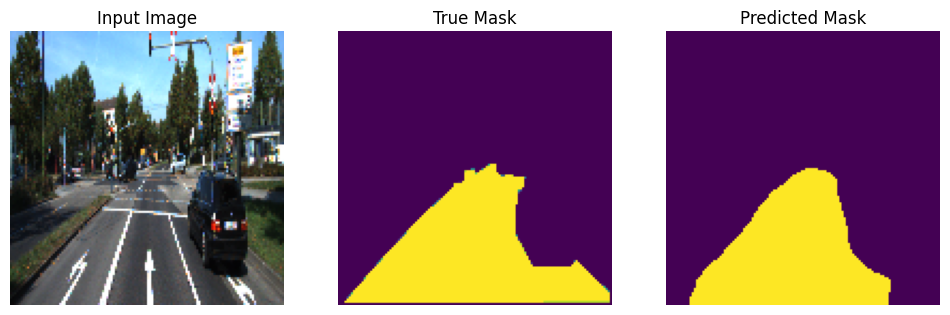

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


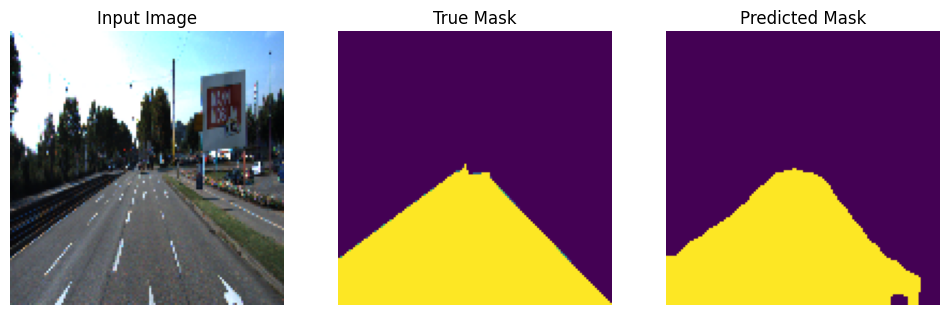

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


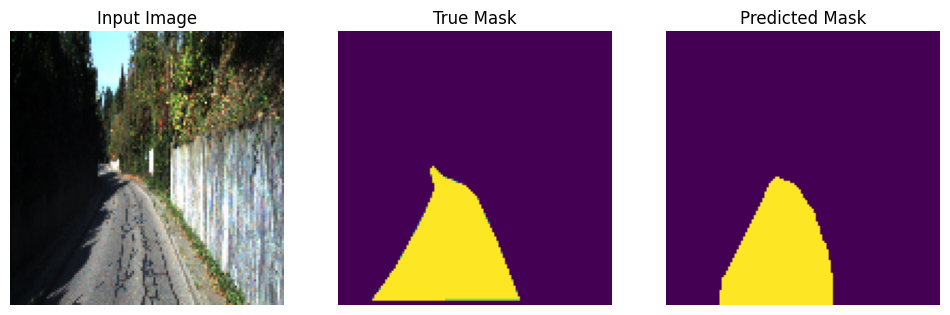

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


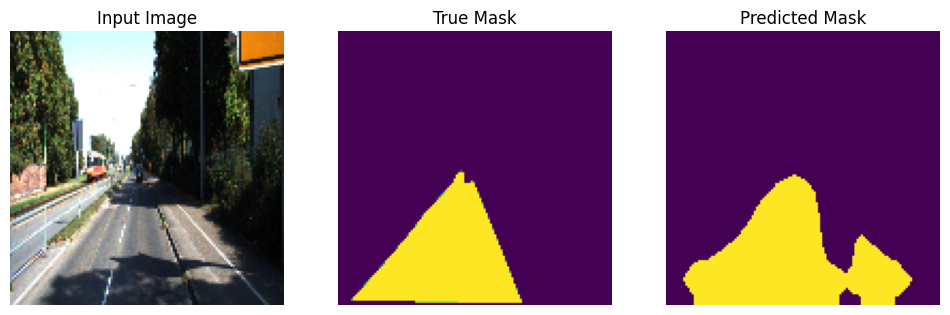

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


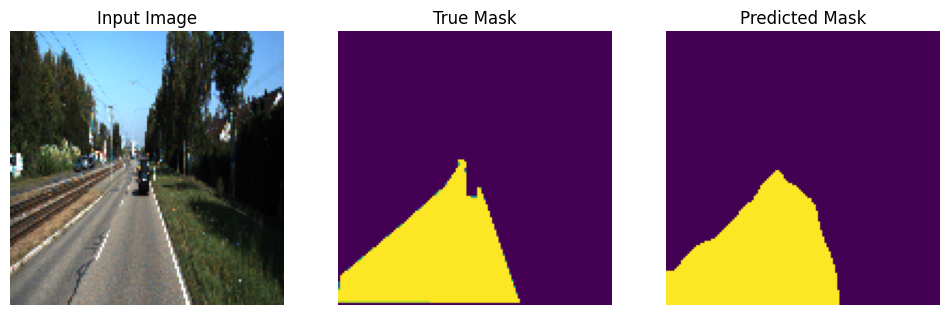

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


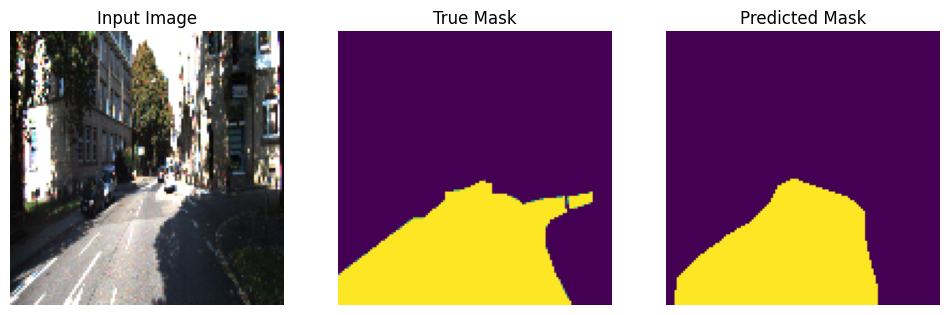

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


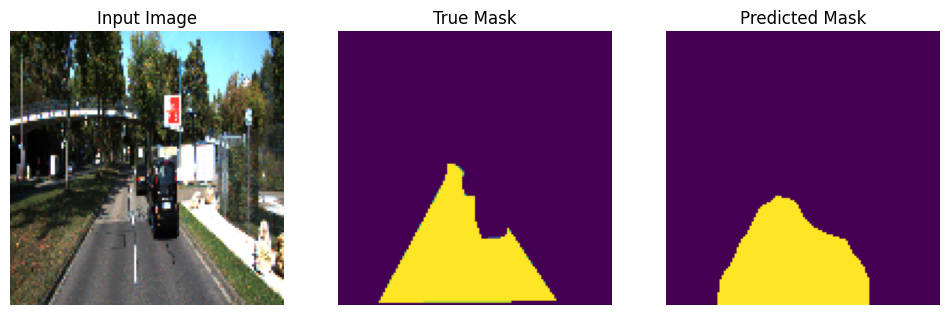

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


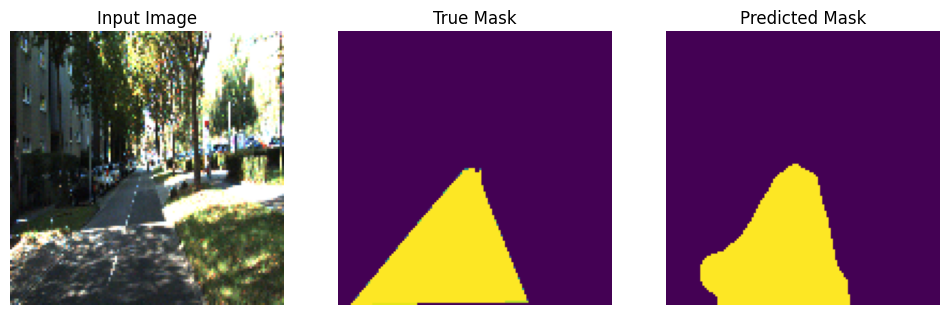

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


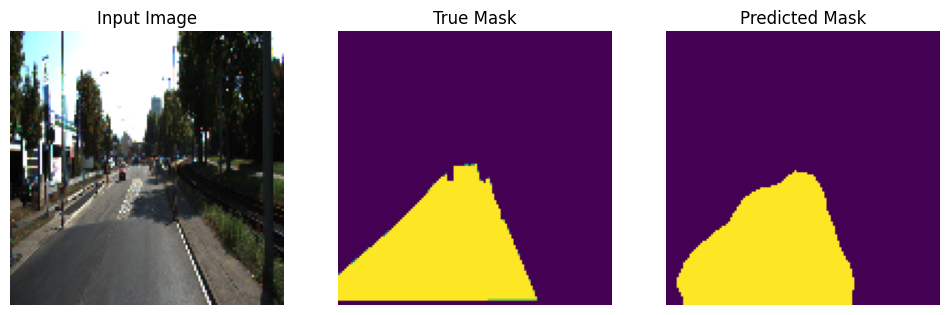

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


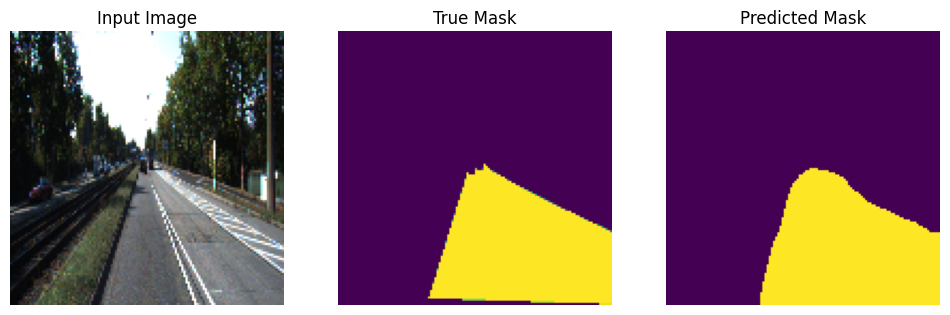

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


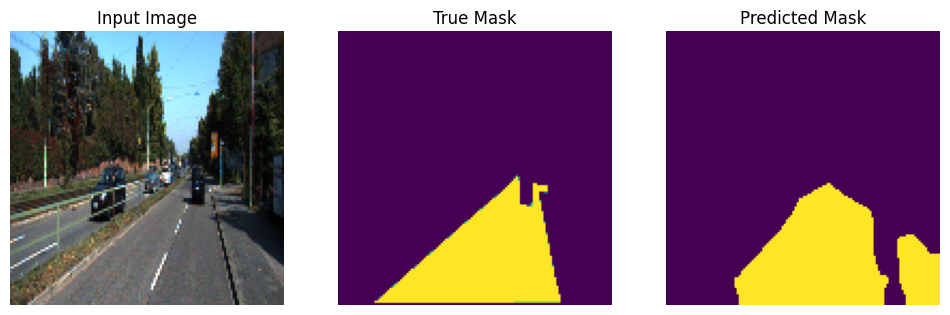

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


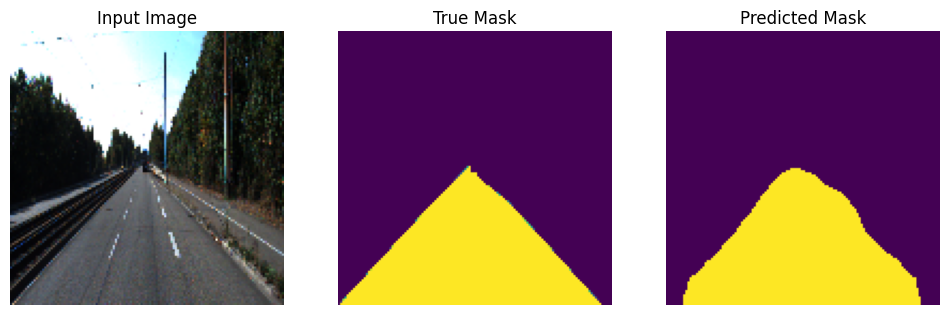

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


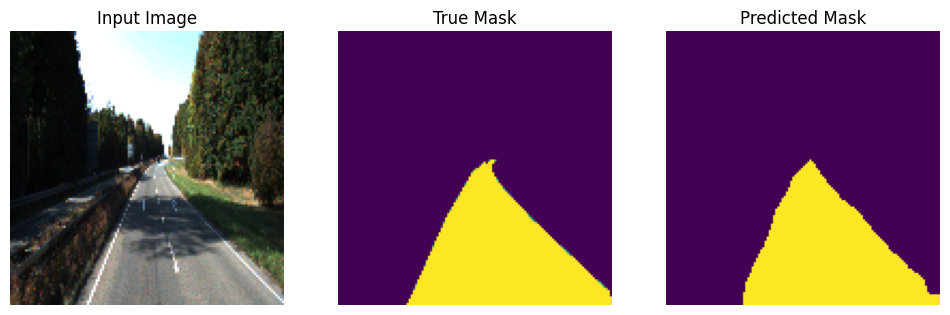

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


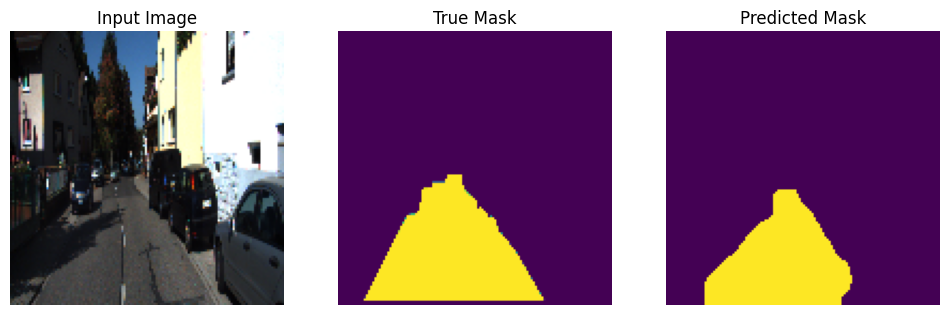

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


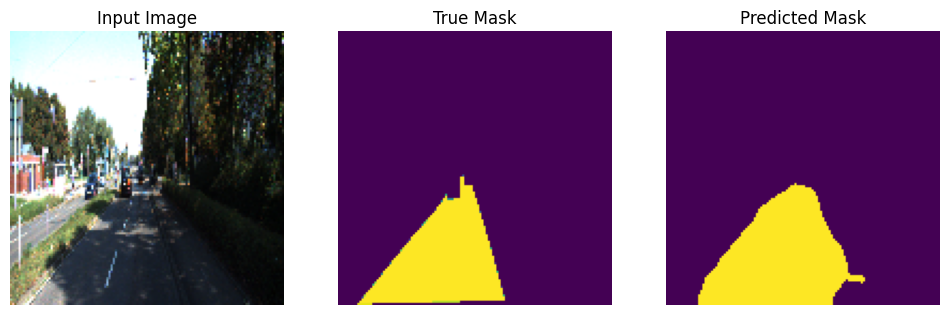

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


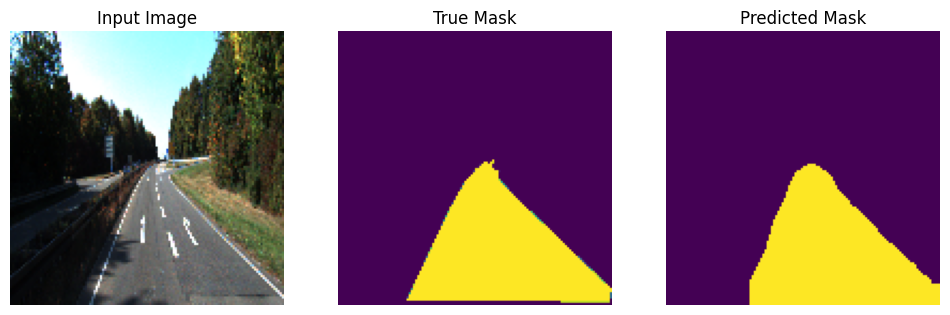

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


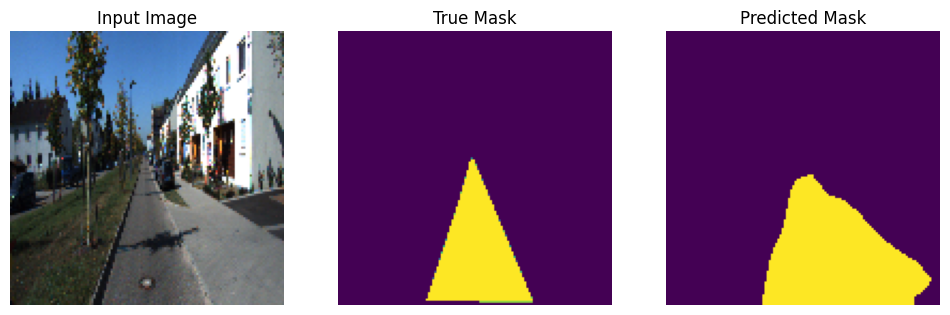

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


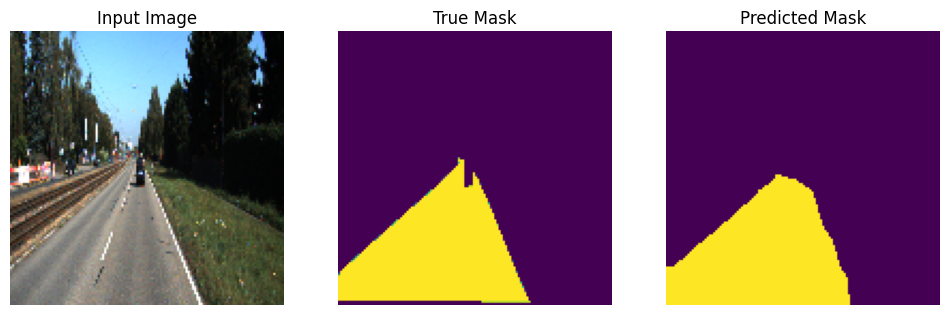

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


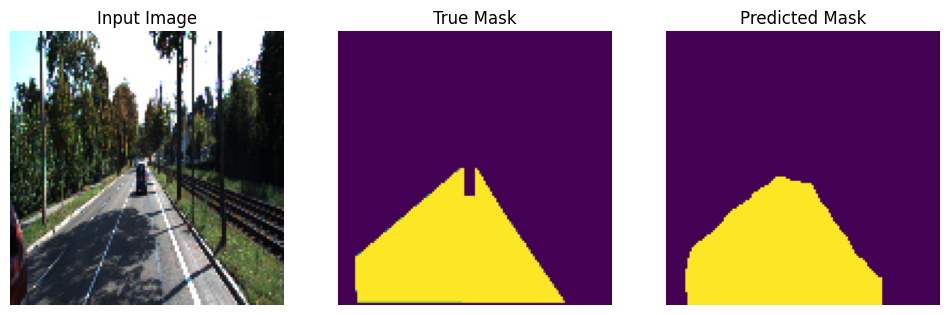

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


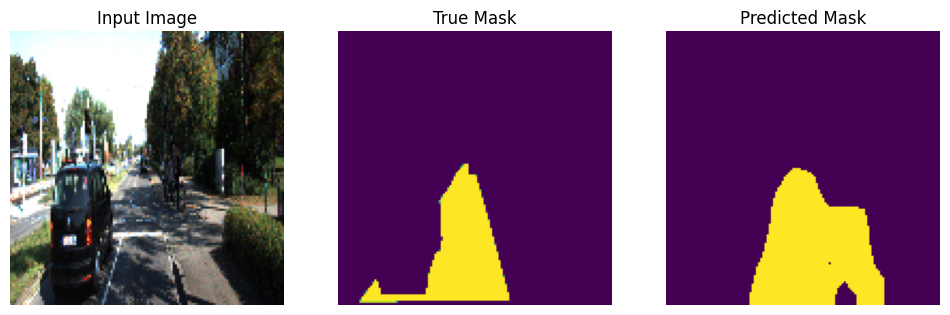

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


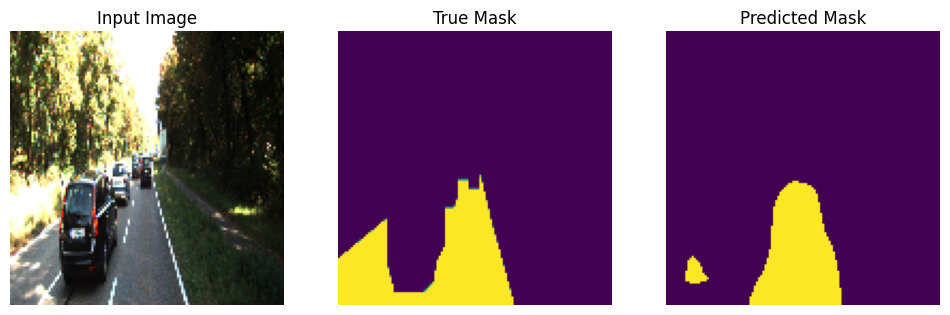

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


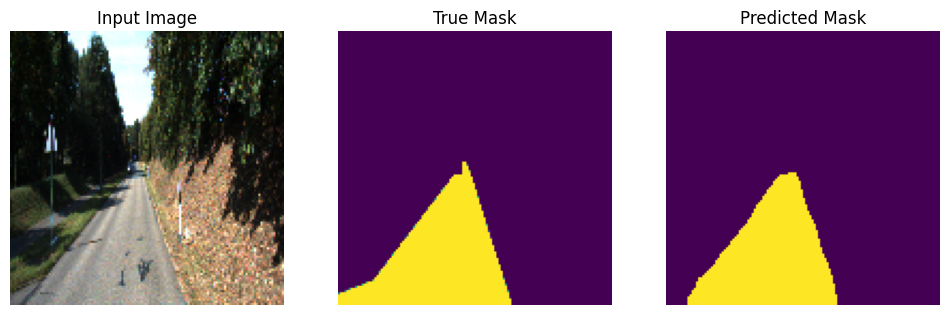

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


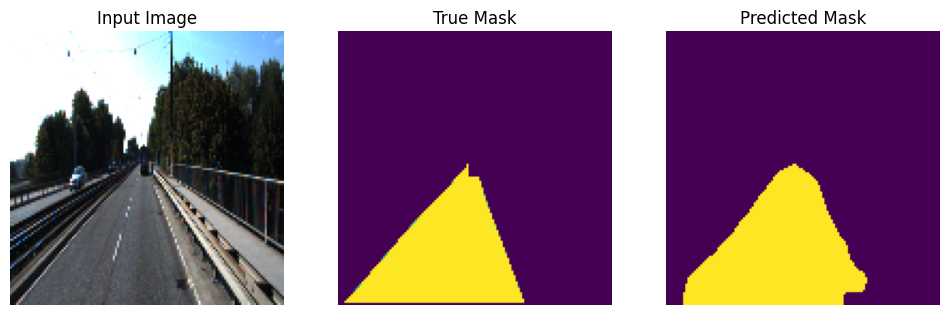

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


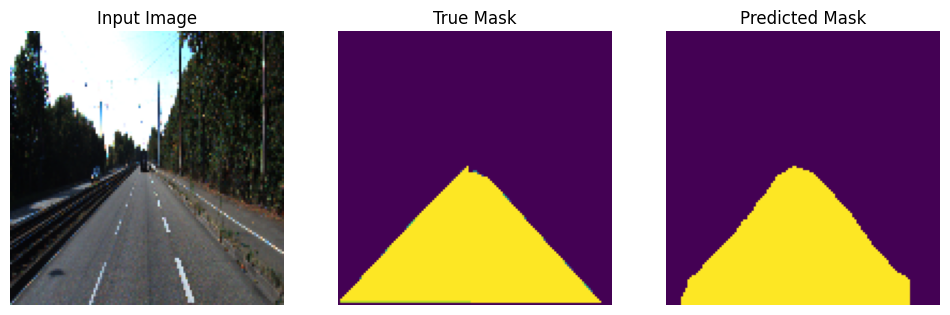

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


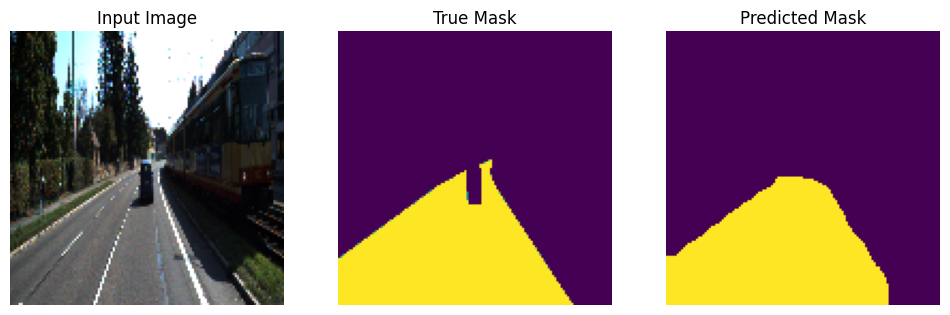

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


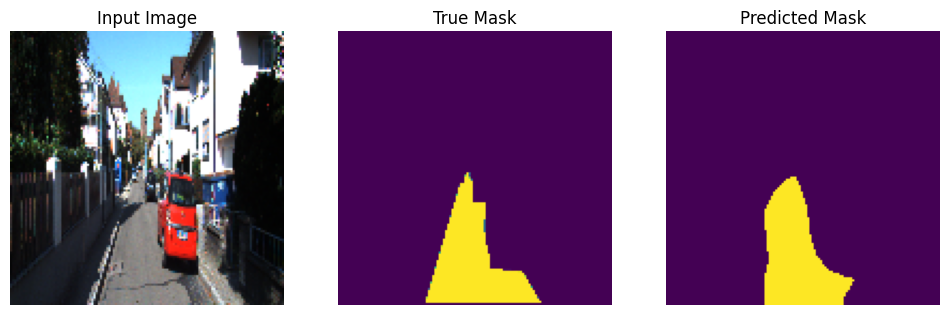


Sample Prediction after epoch 49


Epoch 49: val_loss did not improve from 0.08047
7/7 ━━━━━━━━━━━━━━━━━━━━ 31s 5s/step - loss: 0.0868 - mean_io_u: 0.4120 - val_loss: 0.0841 - val_mean_io_u: 0.4104
Epoch 49: early stopping


In [ ]:
model_history = model.fit(
    dataset['train'],
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_data=dataset['val'],    # finite, no .repeat()
    callbacks=callbacks_list
)

## Testing (Test Dataset)

In [ ]:
# 1) Blend mask on top of image
def weighted_img(img, initial_img, α=1.0, β=0.5, γ=0.0):
    return cv2.addWeighted(initial_img, α, img, β, γ)

# 2) Make a red overlay from a 0/1 mask
def process_image_mask(image: np.ndarray, mask: np.ndarray) -> np.ndarray:
    mask = np.round(mask).astype(np.uint8)
    zero_ch = np.zeros_like(mask)
    red_mask = np.dstack((mask, zero_ch, zero_ch)).astype(np.float32)
    img_f = image.astype(np.float32)
    return weighted_img(red_mask, img_f)

# 3) Squeeze out extra dims and threshold
def create_mask(pred_mask: np.ndarray) -> np.ndarray:
    if pred_mask.ndim == 3 and pred_mask.shape[2] == 1:
        pred_mask = pred_mask[:, :, 0]
    return (pred_mask > 0.5).astype(np.float32)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Processing & saving image 0


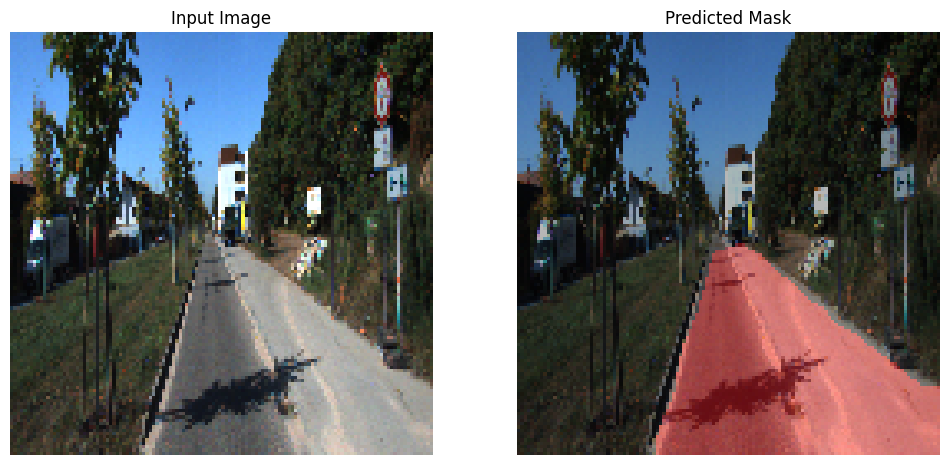

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Processing & saving image 1


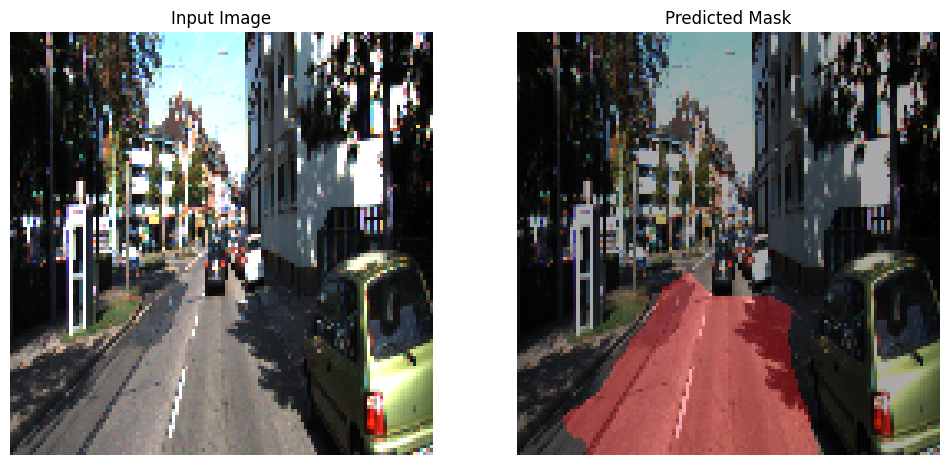

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Processing & saving image 2


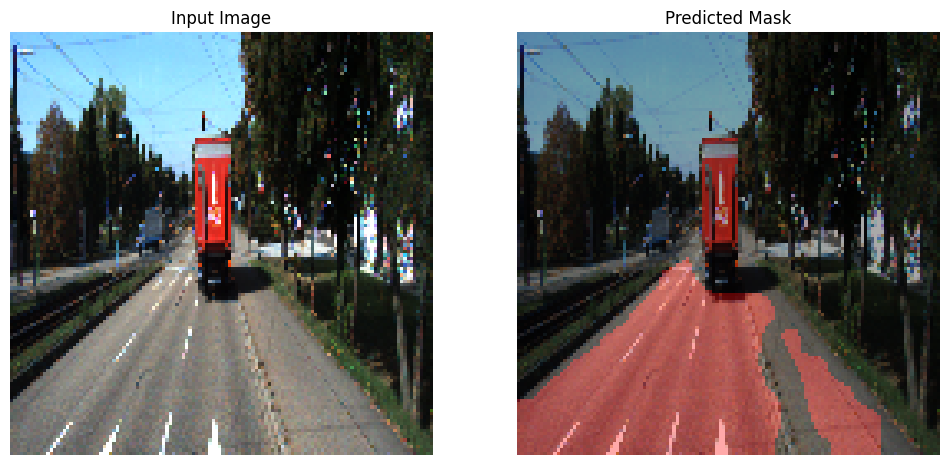

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Processing & saving image 3


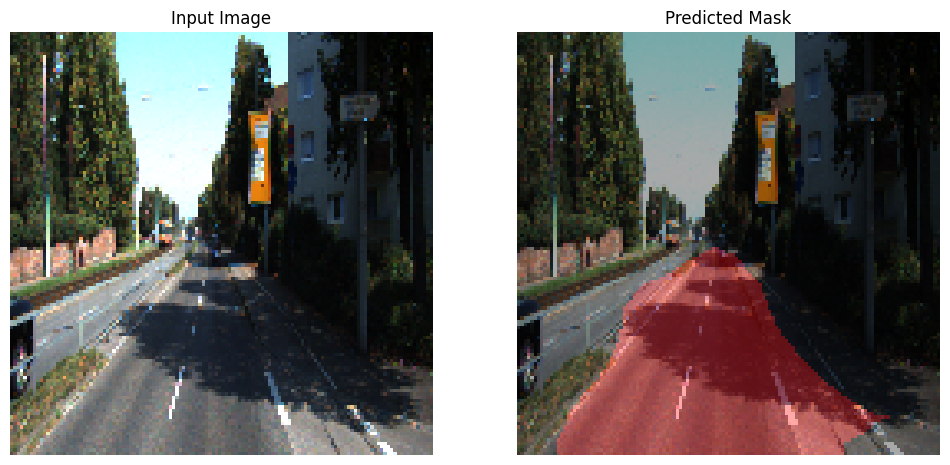

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Processing & saving image 4


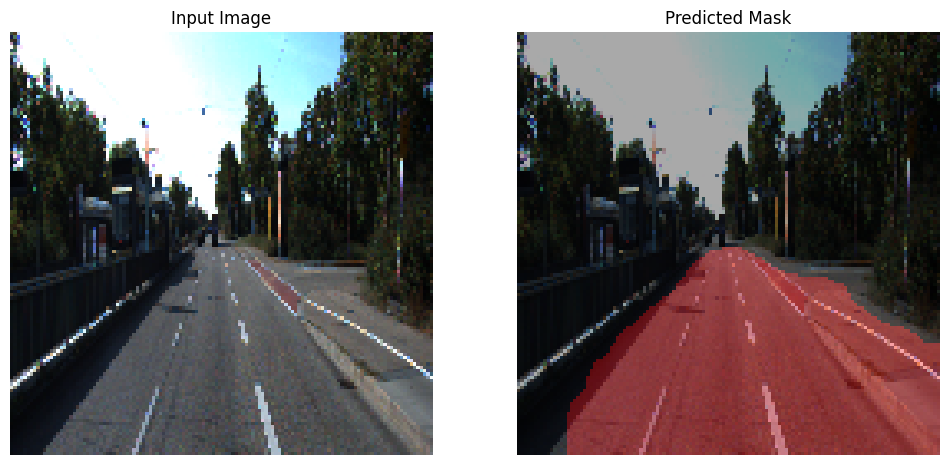

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Processing & saving image 5


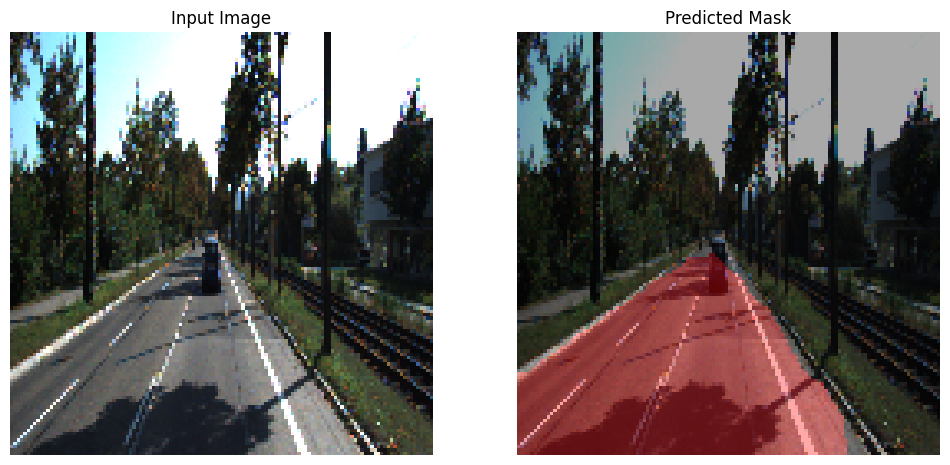

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Processing & saving image 6


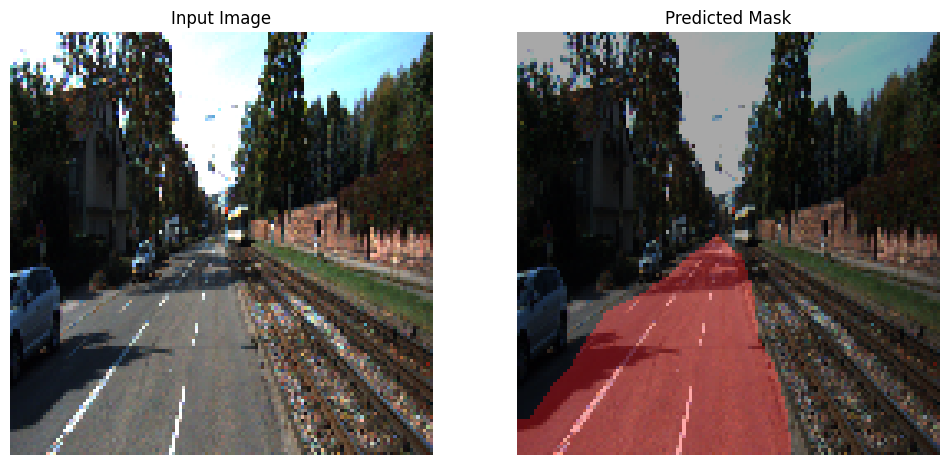

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Processing & saving image 7


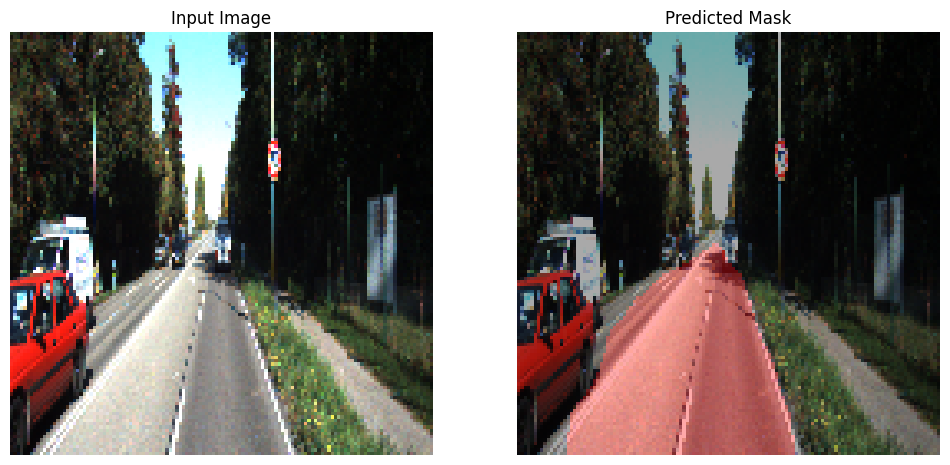

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Processing & saving image 8


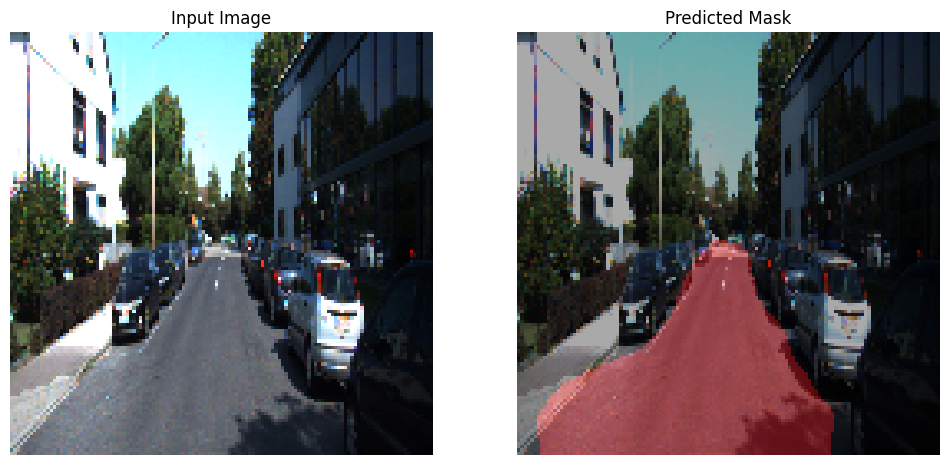

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Processing & saving image 9


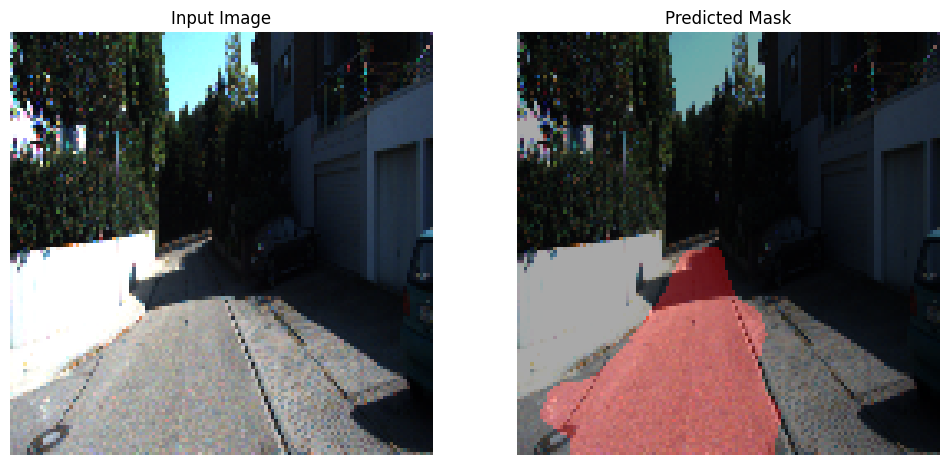

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Processing & saving image 10


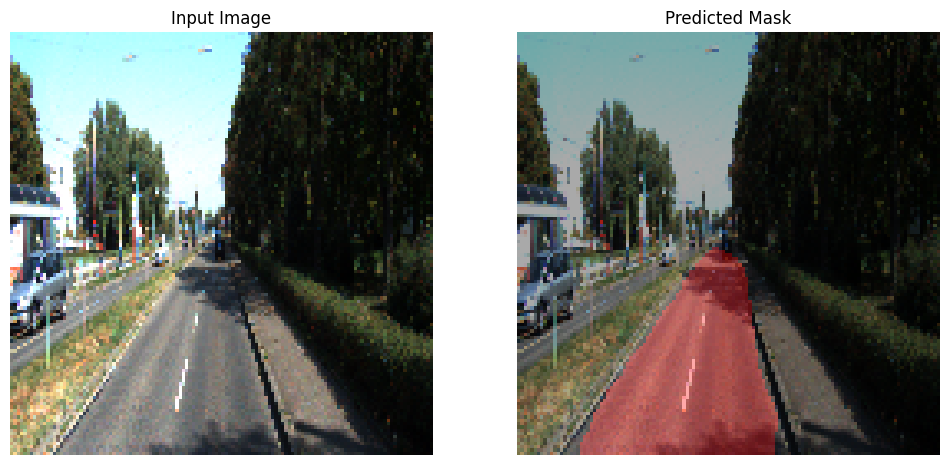

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
Processing & saving image 11


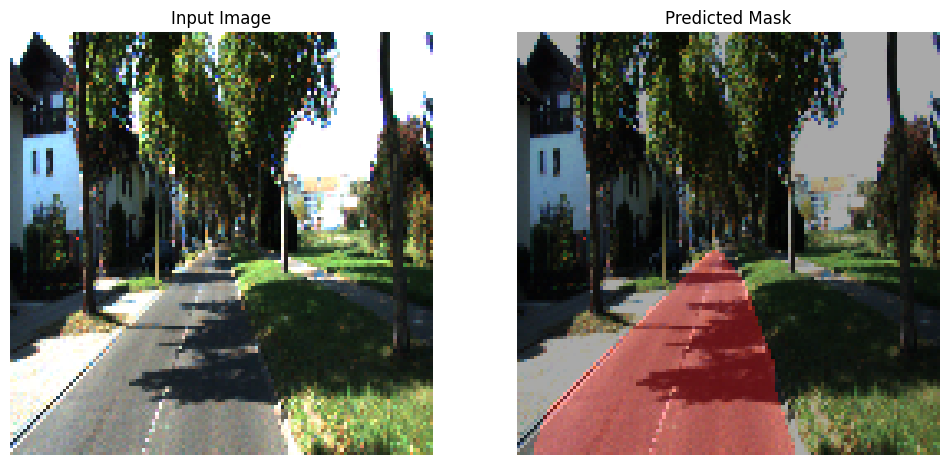

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Processing & saving image 12


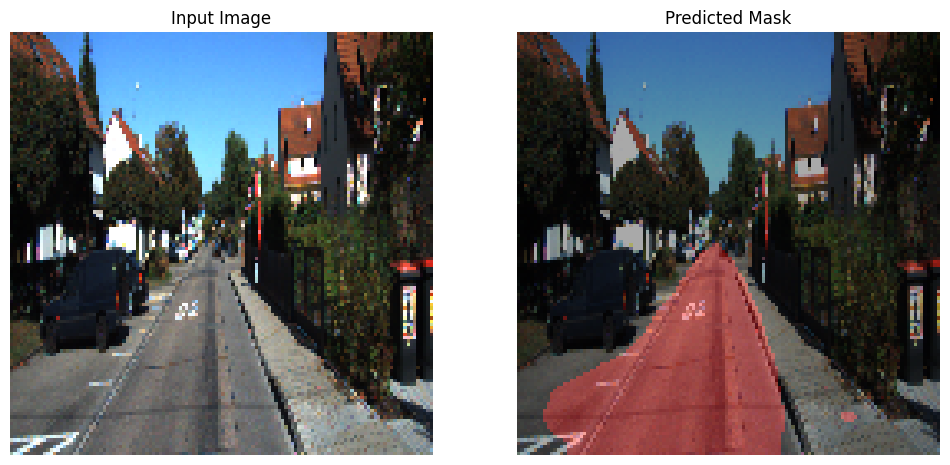

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Processing & saving image 13


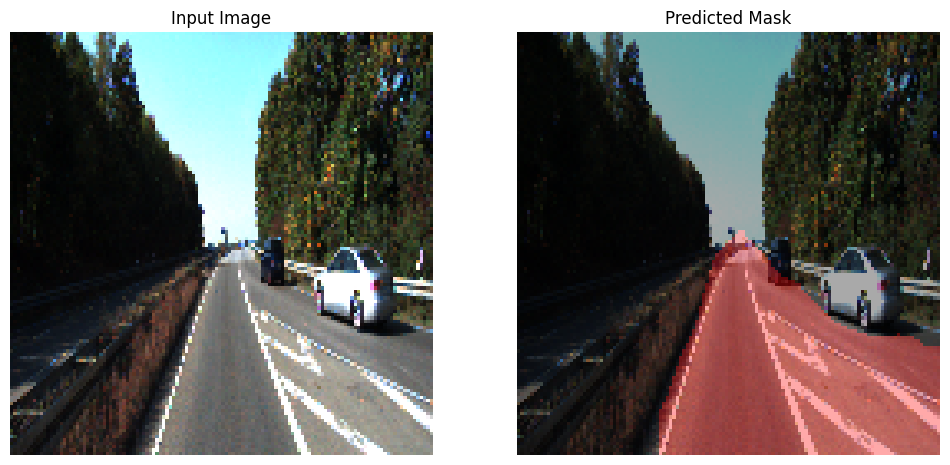

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Processing & saving image 14


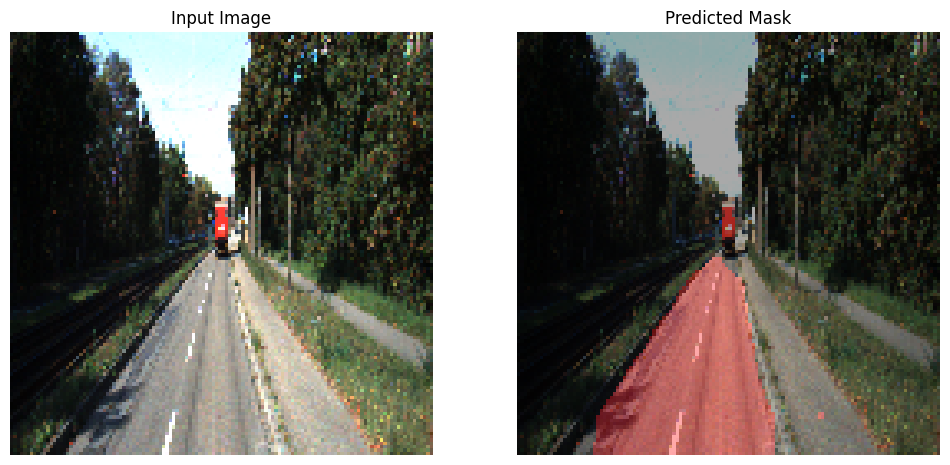

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Processing & saving image 15


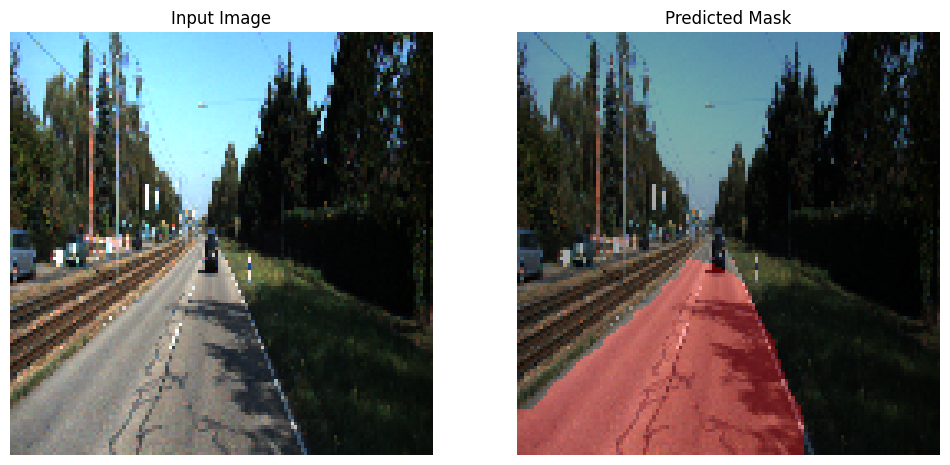

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Processing & saving image 16


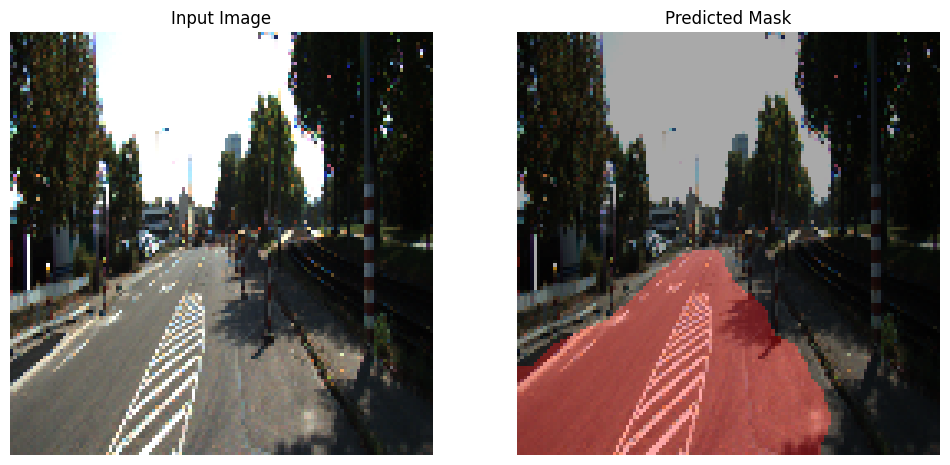

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Processing & saving image 17


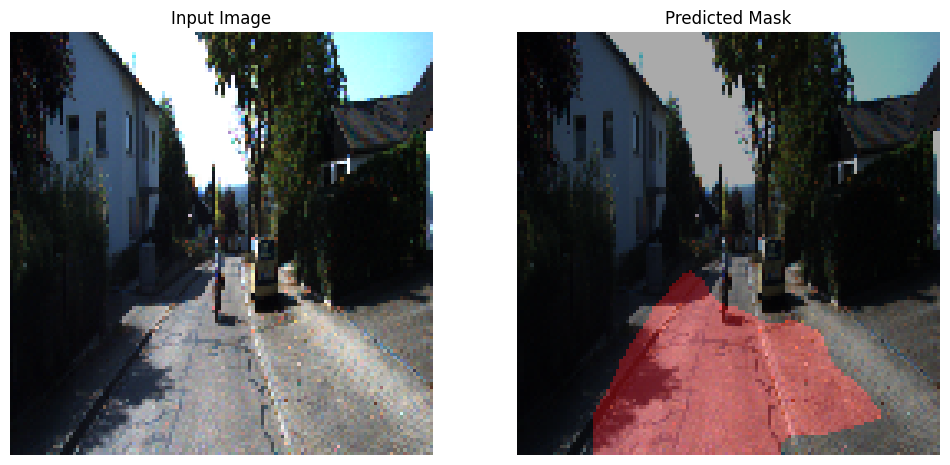

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Processing & saving image 18


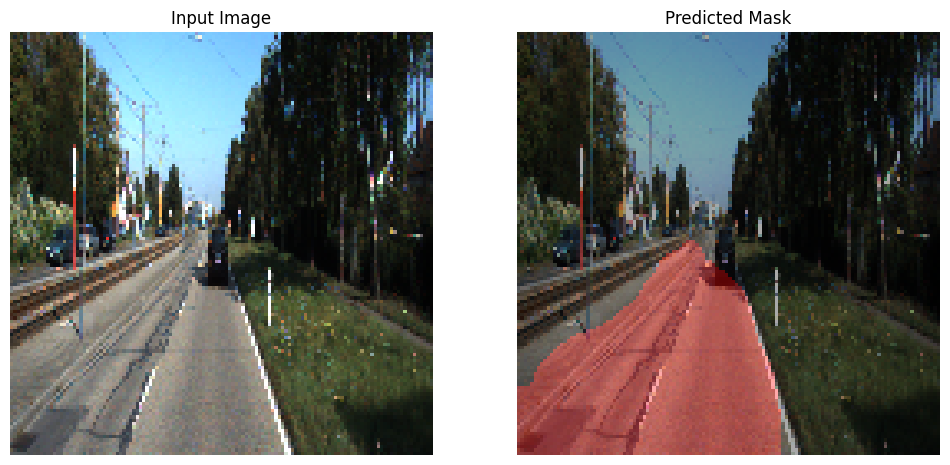

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Processing & saving image 19


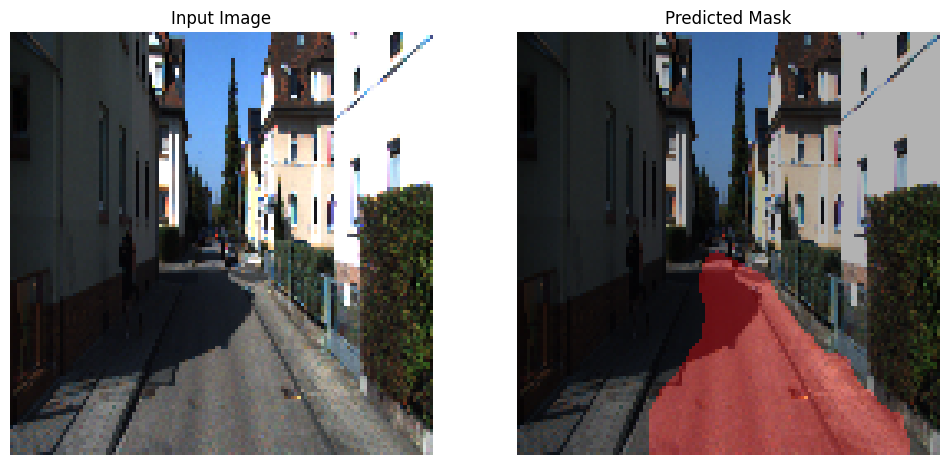

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Processing & saving image 20


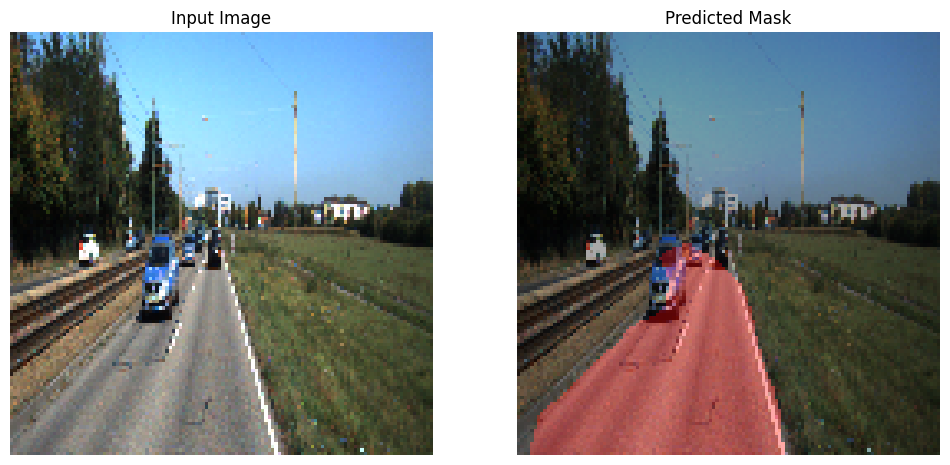

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Processing & saving image 21


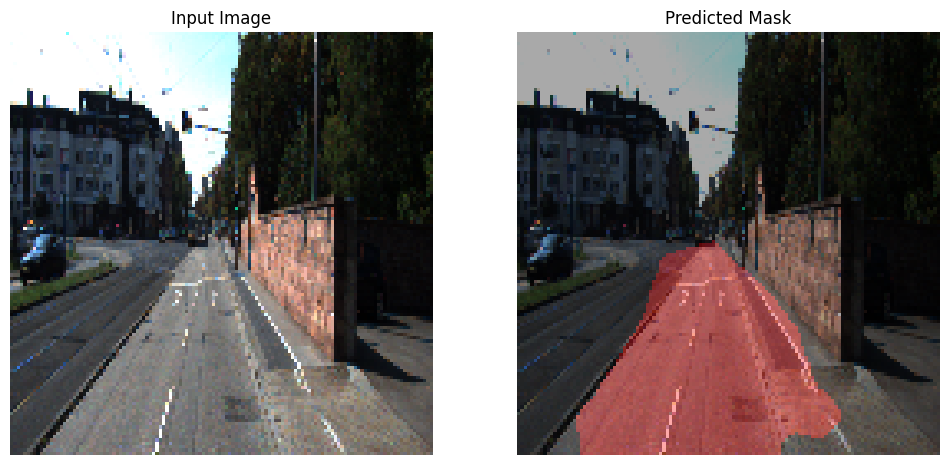

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Processing & saving image 22


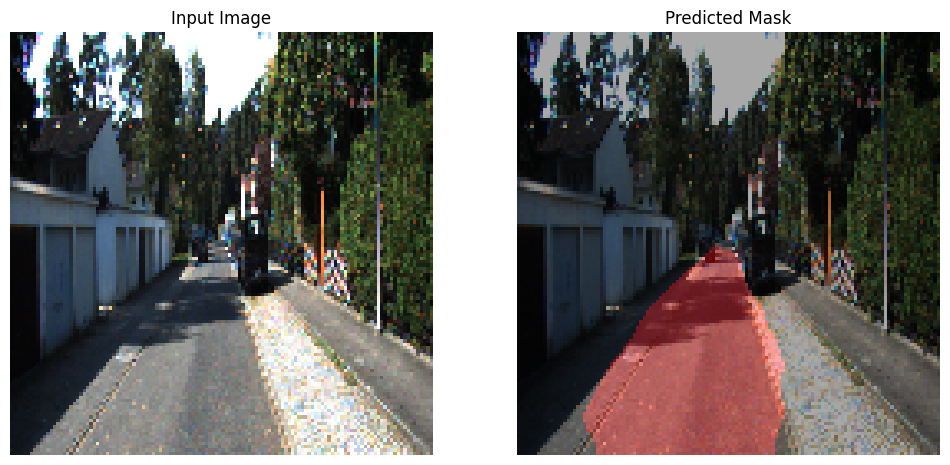

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Processing & saving image 23


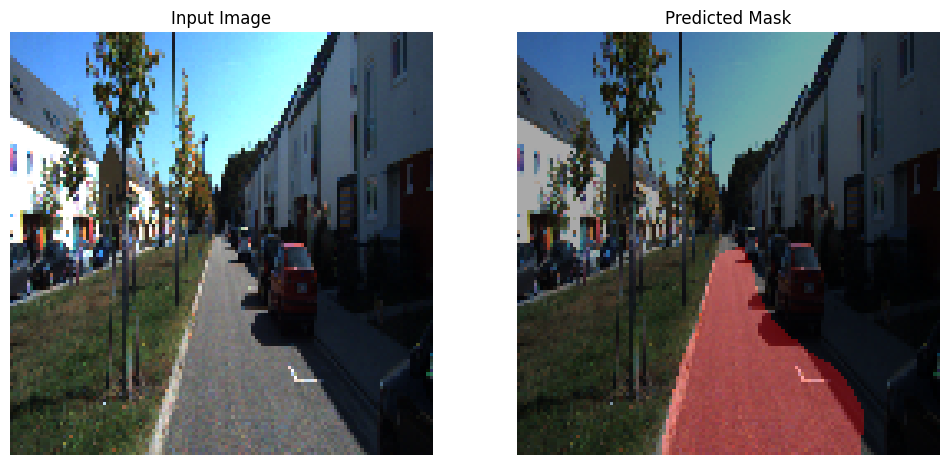

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Processing & saving image 24


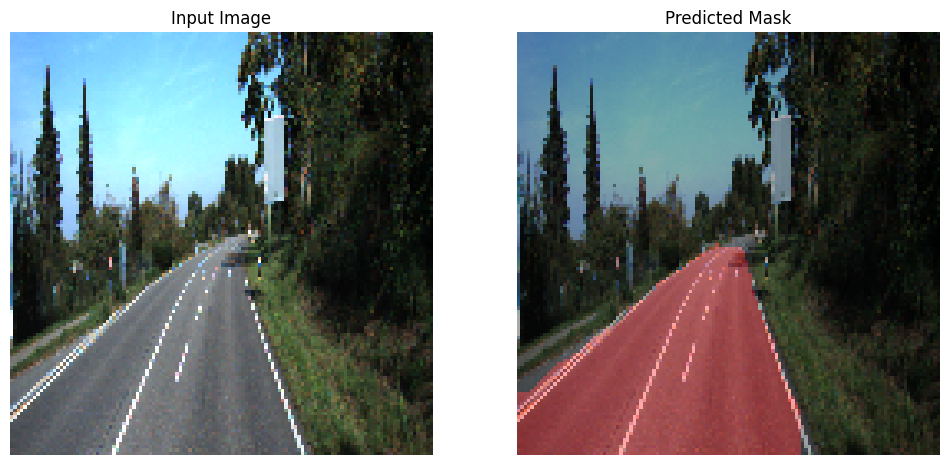

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Processing & saving image 25


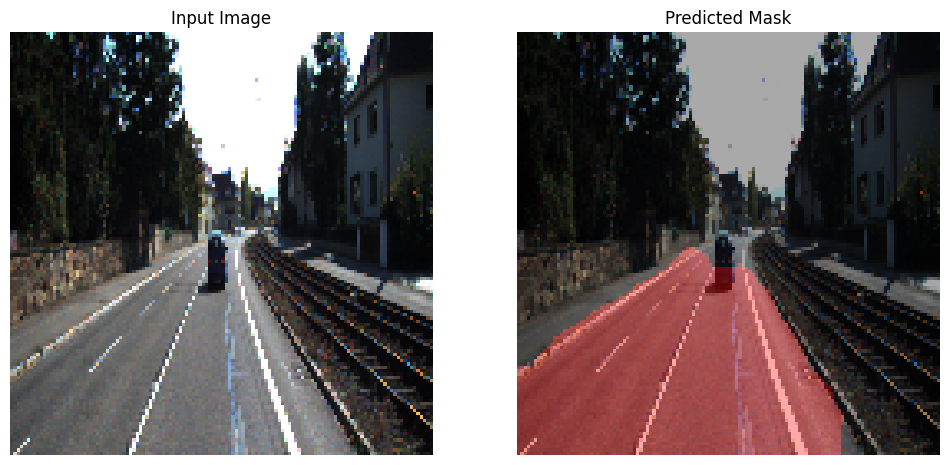

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Processing & saving image 26


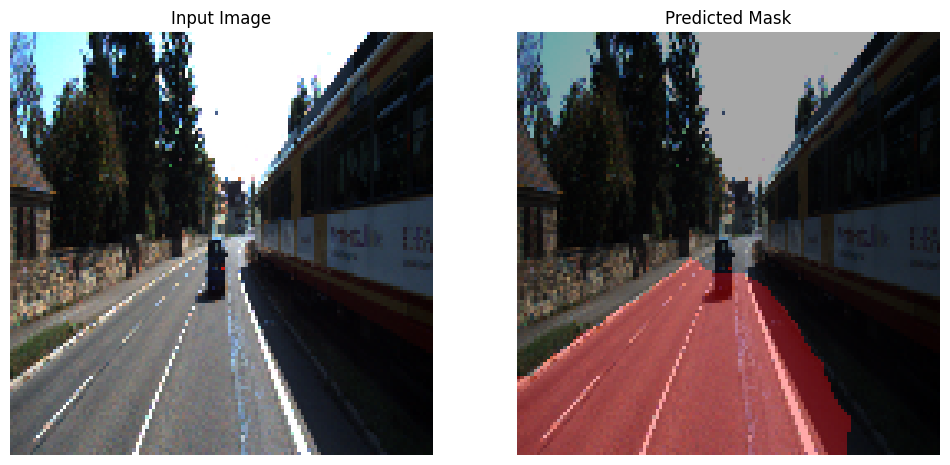

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Processing & saving image 27


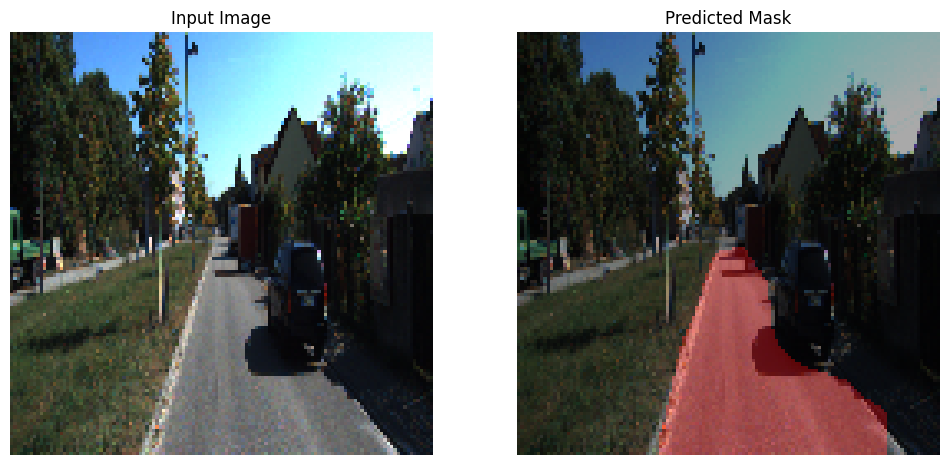

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Processing & saving image 28


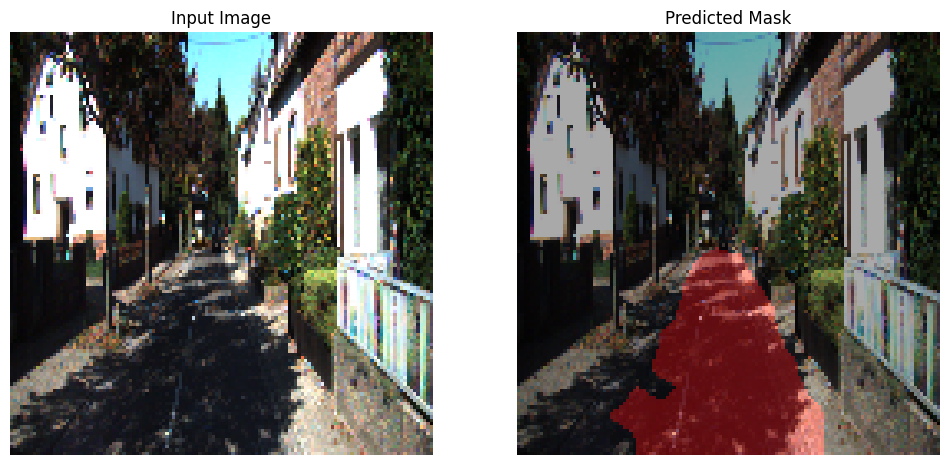

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
Processing & saving image 29


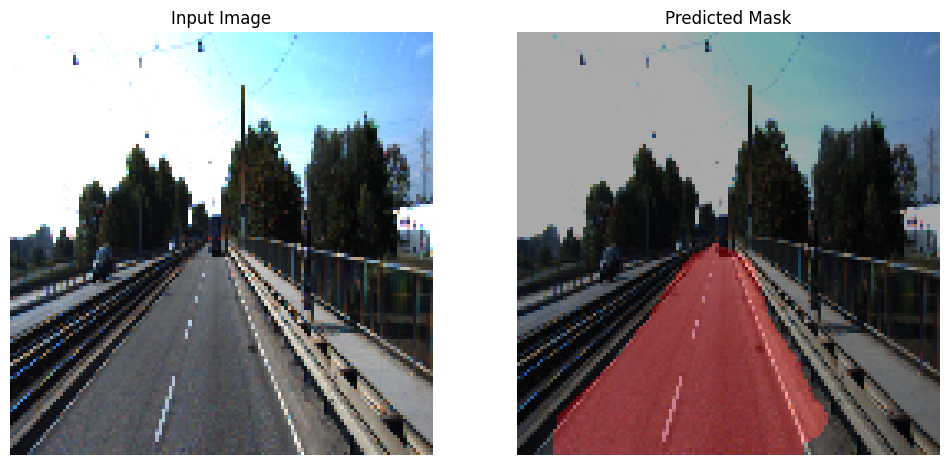

In [ ]:
# 4) Plot, save, and display side-by-side
def save_sample(display_list, index, outdir="outputs"):
    os.makedirs(outdir, exist_ok=True)
    fig = plt.figure(figsize=(12, 6))
    titles = ['Input Image', 'Predicted Mask']
    for i, arr in enumerate(display_list):
        ax = fig.add_subplot(1, len(display_list), i+1)
        ax.set_title(titles[i])
        ax.axis('off')
        ax.imshow(tf.keras.preprocessing.image.array_to_img(arr))
    # save to disk
    fig.savefig(f"{outdir}/{index}.png")
    # display inline
    plt.show()
    plt.close(fig)

# 5) Loop through your test dataset, predict, save & display
def save_and_display_predictions(dataset, model):
    index = 0
    for batch_imgs, _ in dataset:      # assume dataset['test'] is finite & batched
        for img_tensor in batch_imgs:
            img = img_tensor.numpy()
            pred = model.predict(img[None, ...])[0]  # shape (H, W, 1)
            pm = create_mask(pred)
            overlay = process_image_mask(img, pm)
            print(f"Processing & saving image {index}")
            save_sample([img, overlay], index)
            index += 1
        break   # remove if you want *all* batches, not just the first

# USAGE
# make sure dataset['test'] has no .repeat() and *is* batched
save_and_display_predictions(dataset['test'], model)